# Movies recommendation with Azure Open AI & Azure Cognitive Search
## Part 4 - Embeddings visualisation

<img src="https://github.com/retkowsky/images/blob/master/movies_search.png?raw=true">

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import openai
import os
import pandas as pd
import pickle
import plotly.express as px
import pytz
import requests
import sys
import time
import warnings

warnings.filterwarnings("ignore")

from datetime import datetime
from dotenv import load_dotenv
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [2]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

In [3]:
local_tz = pytz.timezone(requests.get("https://ipinfo.io").json()["timezone"])
print("Local time:", datetime.now(local_tz).strftime("%d-%b-%Y %H:%M:%S"))

Local time: 01-Sep-2023 17:34:53


In [4]:
load_dotenv("azure.env")

openai.api_type: str = "azure"
openai.api_key = os.getenv("OPENAI_API_KEY")
openai.api_base = os.getenv("OPENAI_API_BASE")
openai.api_version = os.getenv("OPENAI_API_VERSION")

## 1. UMAP

In [5]:
with open("embeddings/movies.pkl", "rb") as f:
    loaded_data = pickle.load(f)

In [6]:
df = pd.DataFrame(loaded_data)
df.head(5)

,imdb_id,title,cast,director,description,genres,year,embed_overview,embed_title
0,tt0035423,Kate & Leopold,Meg Ryan Hugh Jackman Liev Schreiber Breckin M...,James Mangold,When her scientist ex-boyfriend discovers a po...,Comedy Fantasy Romance Science Fiction,2001,"[0.021089695394039154, -0.010973065160214901, ...","[0.012436236254870892, 0.017795050516724586, 0..."
1,tt0052646,The Brain That Wouldn't Die,Jason Evers Virginia Leith Doris Brent Audrey ...,Joseph Green,Dr. Bill Cortner (Jason Evers) and his fiancÃ©...,Horror Science Fiction,1962,"[-0.012167753651738167, -0.011197278276085854,...","[-0.030167536810040474, 0.009392774663865566, ..."
2,tt0053559,13 Ghosts,Charles Herbert Jo Morrow Martin Milner Rosema...,William Castle,Reclusive Dr. Zorba has died and left his mans...,Horror,1960,"[0.010904512368142605, -0.0042160083539783955,...","[-0.00030440607224591076, -0.01510559953749179..."
3,tt0053580,The Alamo,John Wayne Richard Widmark Laurence Harvey Fra...,John Wayne,The legendary true story of a small band of so...,Action Adventure Drama History Western,1960,"[-0.013121142983436584, -0.021301323547959328,...","[-0.016000520437955856, -0.018589602783322334,..."
4,tt0053604,The Apartment,Jack Lemmon Shirley MacLaine Fred MacMurray Ra...,Billy Wilder,Bud Baxter is a minor clerk in a huge New York...,Comedy Drama Romance,1960,"[-0.00418621813878417, -0.010639390908181667, ...","[-0.0017813920276239514, -0.002438942203298211..."


In [7]:
df.shape

(10784, 9)

In [8]:
embed_vect = df["embed_overview"].tolist()

In [9]:
print("Running Umap on the vectors embeddings...")

start = time.time()
umap_2d = UMAP(n_components=2, init="random", random_state=0)
proj_2d = umap_2d.fit_transform(embed_vect)

print("Done")
elapsed = time.time() - start
print(
    "Elapsed time: "
    + time.strftime(
        "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)
    )
)

Running Umap on the vectors embeddings...
Done
Elapsed time: 00:00:30.740915


In [10]:
fig_2d = px.scatter(
    proj_2d,
    x=0,
    y=1,
    custom_data=[df["title"].tolist(), df["director"].tolist(), df["year"].tolist()],
    title="Movies description Vectors Embeddings UMAP Projections",
    height=640,
)

fig_2d.update_traces(marker_size=5, hovertemplate="%{customdata}")
fig_2d.show()

In [11]:
print("Running Umap on the vectors embeddings...")

start = time.time()
umap_3d = UMAP(n_components=3, init="random", random_state=0)
proj_3d = umap_3d.fit_transform(embed_vect)

print("Done")
elapsed = time.time() - start
print(
    "Elapsed time: "
    + time.strftime(
        "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)
    )
)

Running Umap on the vectors embeddings...
Done
Elapsed time: 00:00:09.316375


In [12]:
fig_3d = px.scatter_3d(
    proj_3d,
    x=0,
    y=1,
    z=2,
    custom_data=[df["title"].tolist(), df["director"].tolist(), df["year"].tolist()],
    title="Movies description Vectors Embeddings UMAP Projections",
    height=860,
)

fig_3d.update_traces(marker_size=3, hovertemplate="%{customdata}")
fig_3d.show()

## 2.Clustering

In [13]:
embed_vect = df["embed_overview"].tolist()
embed_array = np.array(embed_vect)

In [15]:
k_values = range(2, 15)
silhouette_scores = []
max_val = []

print("Performing K-Means...\n")

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=123456)
    kmeans.fit(embed_vect)
    labels = kmeans.labels_
    score = silhouette_score(embed_vect, labels)
    max_val.append(score)
    max_val.sort(reverse=True)
    silhouette_scores.append(score)

    print(
        f"For k = {k:02} => Silhouette score = {score:.5f} | Maximum score = {max_val[0]:.5f}"
    )

print("\nDone")

Performing K-Means...

For k = 02 => Silhouette score = 0.02040 | Maximum score = 0.02040
For k = 03 => Silhouette score = 0.01668 | Maximum score = 0.02040
For k = 04 => Silhouette score = 0.01417 | Maximum score = 0.02040
For k = 05 => Silhouette score = 0.01638 | Maximum score = 0.02040
For k = 06 => Silhouette score = 0.01766 | Maximum score = 0.02040
For k = 07 => Silhouette score = 0.01828 | Maximum score = 0.02040
For k = 08 => Silhouette score = 0.01824 | Maximum score = 0.02040
For k = 09 => Silhouette score = 0.01850 | Maximum score = 0.02040
For k = 10 => Silhouette score = 0.01774 | Maximum score = 0.02040
For k = 11 => Silhouette score = 0.01544 | Maximum score = 0.02040
For k = 12 => Silhouette score = 0.01440 | Maximum score = 0.02040
For k = 13 => Silhouette score = 0.01357 | Maximum score = 0.02040
For k = 14 => Silhouette score = 0.01408 | Maximum score = 0.02040

Done


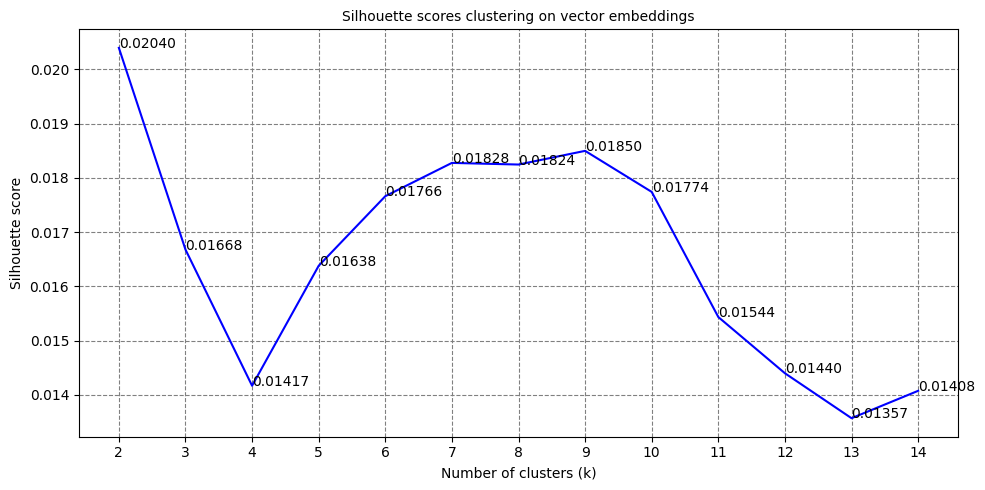

In [16]:
plt.figure(figsize=(10, 5))
plt.plot(k_values, silhouette_scores, color="blue")
plt.title("Silhouette scores clustering on vector embeddings", size=10)
plt.grid(True, color="grey", linestyle="--")

for k, silh in zip(k_values, silhouette_scores):
    plt.text(k, silh, f"{silh:.5f}")

plt.xticks(k_values)
plt.xlabel("Number of clusters (k)")
plt.ylabel("Silhouette score")
plt.tight_layout()

plt.show()

In [17]:
nb_clusters = 9

In [19]:
kmeans = KMeans(n_clusters=nb_clusters, random_state=123456)
kmeans.fit(embed_vect)
labels = kmeans.labels_

print("Cluster labels:\n", labels)
print("\nCluster centers:\n", kmeans.cluster_centers_)
print("\nWithin-cluster sum of squares (inertia) =", kmeans.inertia_)

Cluster labels:
 [6 1 8 ... 0 0 0]

Cluster centers:
 [[-0.00585957 -0.01994482  0.00382632 ... -0.00840379 -0.00711345
  -0.01763035]
 [-0.00053771 -0.02546821 -0.00644274 ... -0.00620796 -0.01308842
  -0.00758642]
 [-0.00103258 -0.02282535 -0.00225576 ... -0.00265008 -0.00753285
  -0.01521705]
 ...
 [-0.00592959 -0.01727672  0.00474088 ... -0.00488284 -0.00810483
  -0.01732634]
 [-0.00395145 -0.01759457  0.00124932 ... -0.01050001 -0.01090007
  -0.00328729]
 [ 0.00181976 -0.01598416  0.00133656 ... -0.00408496 -0.0097607
  -0.01417119]]

Within-cluster sum of squares (inertia) = 2268.3435610406473


Text(0, 0.5, 'Frequency')

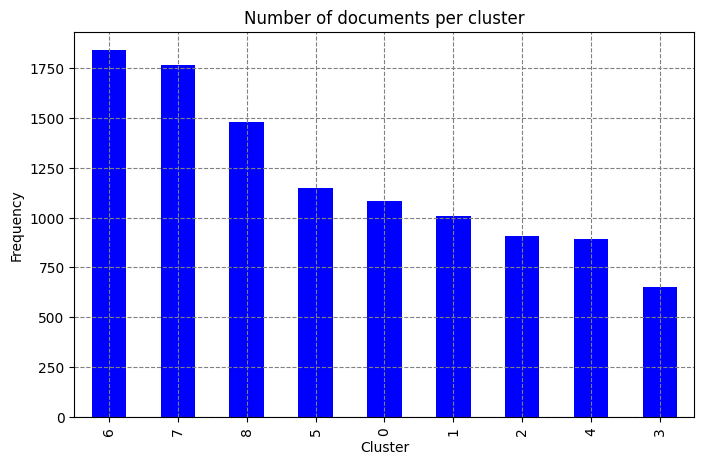

In [20]:
cluster_series = pd.Series(labels, name="cluster")

ax = cluster_series.value_counts().plot(
    kind="bar", figsize=(8, 5), title="Number of documents per cluster", color="blue"
)

plt.grid(True, color="grey", linestyle="--")
ax.set_xlabel("Cluster")
ax.set_ylabel("Frequency")

In [22]:
imdb_id = df["imdb_id"].tolist()
title = df["title"].tolist()
description = df["description"].tolist()
director = df["director"].tolist()
genres = df["genres"].tolist()
year = df["year"].tolist()

df_clusters = pd.DataFrame(
    {
        "imdb_id": imdb_id,
        "title": title,
        "description": description,
        "director": director,
        "genres": genres,
        "year": year,
        "embed_overview": embed_vect,
        "cluster": labels,
    }
)

df_clusters["cluster"] = df_clusters["cluster"].astype(str)

In [23]:
df_clusters

,imdb_id,title,description,director,genres,year,embed_overview,cluster
0,tt0035423,Kate & Leopold,When her scientist ex-boyfriend discovers a po...,James Mangold,Comedy Fantasy Romance Science Fiction,2001,"[0.021089695394039154, -0.010973065160214901, ...",6
1,tt0052646,The Brain That Wouldn't Die,Dr. Bill Cortner (Jason Evers) and his fiancÃ©...,Joseph Green,Horror Science Fiction,1962,"[-0.012167753651738167, -0.011197278276085854,...",1
2,tt0053559,13 Ghosts,Reclusive Dr. Zorba has died and left his mans...,William Castle,Horror,1960,"[0.010904512368142605, -0.0042160083539783955,...",8
3,tt0053580,The Alamo,The legendary true story of a small band of so...,John Wayne,Action Adventure Drama History Western,1960,"[-0.013121142983436584, -0.021301323547959328,...",4
4,tt0053604,The Apartment,Bud Baxter is a minor clerk in a huge New York...,Billy Wilder,Comedy Drama Romance,1960,"[-0.00418621813878417, -0.010639390908181667, ...",6
...,...,...,...,...,...,...,...,...
10779,tt5210380,Merry Kissmas,Unwinding her relationship from a controlling ...,Michael Feifer,Romance TV Movie,2015,"[-0.017712777480483055, -0.03171822801232338, ...",6
10780,tt5223342,Minions The Competition,Two minions working in a bomb lab get competit...,Kyle Balda Julien Soret,Animation,2015,"[-0.02413146011531353, -0.029324648901820183, ...",1
10781,tt5227516,Ellis,Ellis a fourteen-minute film directed by JR an...,JR,Drama,2015,"[-0.006265816744416952, -0.021009694784879684,...",0
10782,tt5297750,Taylor Swift The 1989 World Tour - Live,Taylor delivers the concert event of the year....,Jonas Ã…kerlund,Documentary Music,2015,"[-0.009467614814639091, -0.031580112874507904,...",0


## 3. Clusters UMAP

In [24]:
fig_2d = px.scatter(
    proj_2d,
    x=0,
    y=1,
    color=df_clusters["cluster"].tolist(),
    labels={"color": "Cluster"},
    custom_data=[
        df_clusters["imdb_id"].tolist(),
        df_clusters["title"].tolist(),
        df_clusters["year"].tolist(),
    ],
    title="Movies description Vectors Embeddings UMAP Projections",
    height=640,
)

fig_2d.update_traces(marker_size=5, hovertemplate="%{customdata}")
fig_2d.show()

In [25]:
fig_3d = px.scatter_3d(
    proj_3d,
    x=0,
    y=1,
    z=2,
    color=df_clusters["cluster"].tolist(),
    labels={"color": "Cluster"},
    custom_data=[
        df_clusters["imdb_id"].tolist(),
        df_clusters["title"].tolist(),
        df_clusters["year"].tolist(),
    ],
    title="Movies description Vectors Embeddings UMAP Projections",
    height=1024,
)

fig_3d.update_traces(marker_size=3, hovertemplate="%{customdata}")
fig_3d.show()

## 4. Let's define the clusters using Azure Open AI

In [28]:
docs_per_cluster = 40

In [32]:
cluster_labels = []

for i in range(nb_clusters):
    moviesdocs = "\n".join(
        df_clusters[df_clusters.cluster == str(i)]
        .description.map(lambda x: x[:300])
        .sample(docs_per_cluster, random_state=5426)
        .values
    )

    response = openai.Completion.create(
        engine="text-davinci-003",
        prompt=f'You should identify one movie genre based on these movies description documents.\
         Movie genre values are: Action or Crime or Comedy or Horror or Sci-Fi or War.\
        \n\nDocuments:\n"""\n{moviesdocs}\n"""\n\nTopic:',
        temperature=1,
        max_tokens=1000,
        top_p=1,
        frequency_penalty=0,
        presence_penalty=0,
    )

    print("Cluster", i, ":", response["choices"][0]["text"].replace("\n", ""))
    result = str(i) + response["choices"][0]["text"].replace("\n", "")
    cluster_labels.append(result)

print("Done")

Cluster 0 :  Comedy
Cluster 1 :  Sci-Fi
Cluster 2 :  Comedy
Cluster 3 :  Adventure
Cluster 4 :  War
Cluster 5 :  Comedy
Cluster 6 :  Romantic Comedy
Cluster 7 :  Crime
Cluster 8 :  Horror
Done


In [33]:
data_split = [(item.split()[0], " ".join(item.split()[1:])) for item in cluster_labels]
df_clusterlabels = pd.DataFrame(data_split, columns=["cluster", "cluster label"])
df_clusterlabels["cluster"] = df_clusterlabels["cluster"].astype(str)
merged_df = pd.merge(df_clusters, df_clusterlabels, on="cluster", how="left")
merged_df["cluster_label"] = (
    merged_df["cluster"].astype(str) + " " + merged_df["cluster label"]
)

In [35]:
merged_df.head(10)

,imdb_id,title,description,director,genres,year,embed_overview,cluster,cluster label,cluster_label
0,tt0035423,Kate & Leopold,When her scientist ex-boyfriend discovers a po...,James Mangold,Comedy Fantasy Romance Science Fiction,2001,"[0.021089695394039154, -0.010973065160214901, ...",6,Romantic Comedy,6 Romantic Comedy
1,tt0052646,The Brain That Wouldn't Die,Dr. Bill Cortner (Jason Evers) and his fiancÃ©...,Joseph Green,Horror Science Fiction,1962,"[-0.012167753651738167, -0.011197278276085854,...",1,Sci-Fi,1 Sci-Fi
2,tt0053559,13 Ghosts,Reclusive Dr. Zorba has died and left his mans...,William Castle,Horror,1960,"[0.010904512368142605, -0.0042160083539783955,...",8,Horror,8 Horror
3,tt0053580,The Alamo,The legendary true story of a small band of so...,John Wayne,Action Adventure Drama History Western,1960,"[-0.013121142983436584, -0.021301323547959328,...",4,War,4 War
4,tt0053604,The Apartment,Bud Baxter is a minor clerk in a huge New York...,Billy Wilder,Comedy Drama Romance,1960,"[-0.00418621813878417, -0.010639390908181667, ...",6,Romantic Comedy,6 Romantic Comedy
5,tt0053644,The Bellboy,Stanley is a bellboy at the Fountainbleau Hote...,Jerry Lewis,Comedy Family,1960,"[-0.020167861133813858, -0.02348494343459606, ...",2,Comedy,2 Comedy
6,tt0053677,The Brides of Dracula,A young teacher on her way to a position in Tr...,Terence Fisher,Horror,1960,"[-0.005790144205093384, -0.03431101515889168, ...",8,Horror,8 Horror
7,tt0053699,Carry On Constable,With a flu epidemic running rife three new bum...,Gerald Thomas,Comedy,1960,"[-0.015919867902994156, -0.007876583375036716,...",7,Crime,7 Crime
8,tt0053716,Cinderfella,This was Jerry Lewis' answer to the classic Ci...,Frank Tashlin,Comedy Romance,1960,"[0.00022941535280551761, -0.02321958914399147,...",3,Adventure,3 Adventure
9,tt0053719,The City of the Dead,A young coed (Nan Barlow) uses her winter vaca...,John Llewellyn Moxey,Horror,1960,"[0.0006394291413016617, -0.03325202316045761, ...",8,Horror,8 Horror


<Axes: xlabel='cluster_label'>

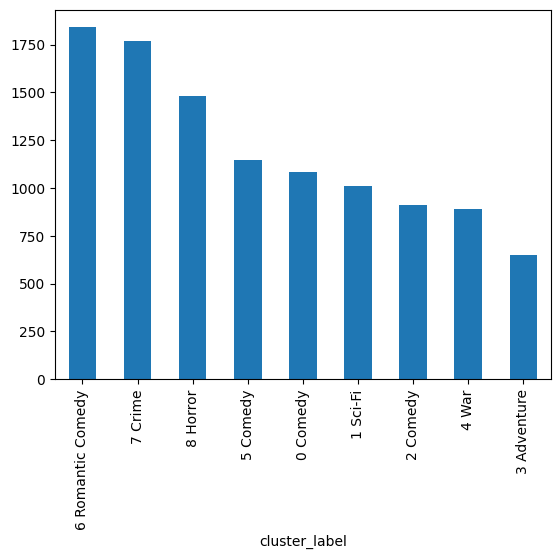

In [36]:
merged_df["cluster_label"].value_counts(sort=True).plot.bar()

In [37]:
fig_2d = px.scatter(
    proj_2d,
    x=0,
    y=1,
    color=merged_df["cluster_label"].tolist(),
    labels={"color": "cluster_label"},
    custom_data=[
        merged_df["imdb_id"].tolist(),
        merged_df["title"].tolist(),
        merged_df["year"].tolist(),
    ],
    height=640,
)

fig_2d.update_traces(marker_size=5, hovertemplate="%{customdata}")
fig_2d.update_layout(
    legend=dict(orientation="h"),
    legend_x=0,
    legend_y=5,
)
fig_2d.show()

In [38]:
fig_3d = px.scatter_3d(
    proj_3d,
    x=0,
    y=1,
    z=2,
    color=merged_df["cluster_label"].tolist(),
    labels={"color": "cluster_label"},
    custom_data=[
        merged_df["imdb_id"].tolist(),
        merged_df["title"].tolist(),
        merged_df["year"].tolist(),
    ],
    height=860,
)

fig_3d.update_traces(marker_size=3, hovertemplate="%{customdata}")
fig_3d.update_layout(
    legend=dict(orientation="h"),
    legend_x=0,
    legend_y=5,
)
fig_3d.show()

In [44]:
import nomic
from nomic import atlas

In [45]:
atlas_nomic_key = "6mdTWCHN4nETbHGJxuWYTSswZyfaPCU-n88DcjD3WDFkK"
nomic.login(atlas_nomic_key)

In [75]:
clusterlabel = merged_df["cluster_label"].tolist()
movieslist = df["title"].tolist() 

In [76]:
datapoints = [
    {"title": title, "id": idx, "cluster_label": clusterlabel[i]}
    for idx, title in enumerate(movieslist)
]

In [78]:
project = atlas.map_embeddings(
    embeddings=np.array(embed_vect),  # images vector embeddings
    data=datapoints,  # datapoints
    id_field="id",  # id
    name="title",  # image filename
    colorable_fields=["cluster_label"],  # cluster label
    reset_project_if_exists=True,
    is_public=True,  # public map
)

map = project.get_map(
    "Clustering images vector embeddings with Azure Computer Vision 4"
)

print(map)
project.maps[0]

2023-09-01 16:01:37.093 | INFO     | nomic.project:__init__:702 - Found existing project `title` in organization `seretkow`. Clearing it of data by request.
2023-09-01 16:01:38.068 | INFO     | nomic.project:_create_project:790 - Creating project `title` in organization `seretkow`
2023-09-01 16:01:39.439 | INFO     | nomic.atlas:map_embeddings:107 - Uploading embeddings to Atlas.
2023-09-01 16:01:39.652 | WARNING  | nomic.project:_validate_and_correct_arrow_upload:261 - id_field is not a string. Converting to string from int32
9it [00:01,  4.76it/s]                       
2023-09-01 16:01:41.545 | INFO     | nomic.project:_add_data:1422 - Upload succeeded.
2023-09-01 16:01:41.546 | INFO     | nomic.atlas:map_embeddings:126 - Embedding upload succeeded.
2023-09-01 16:01:43.115 | INFO     | nomic.project:create_index:1132 - Created map `title` in project `title`: https://atlas.nomic.ai/map/d7caa36d-a104-4199-af8d-9797ef759f2d/ec0385fe-d74b-4bda-ab10-ed4d1d79995d
2023-09-01 16:01:43.116 |

title: https://atlas.nomic.ai/map/d7caa36d-a104-4199-af8d-9797ef759f2d/ec0385fe-d74b-4bda-ab10-ed4d1d79995d


title: https://atlas.nomic.ai/map/d7caa36d-a104-4199-af8d-9797ef759f2d/ec0385fe-d74b-4bda-ab10-ed4d1d79995d